In [0]:
%pip install nltk
%matplotlib inline
!pip install wordcloud

Python interpreter will be restarted.
  Using cached nltk-3.7-py3-none-any.whl (1.5 MB)
  Using cached tqdm-4.64.1-py2.py3-none-any.whl (78 kB)
  Using cached regex-2022.10.31-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (769 kB)
Python interpreter will be restarted.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-4c208398-e381-4456-b5a6-81fe90ca0001/bin/python -m pip install --upgrade pip' command.


In [0]:
# installing libs

import nltk
#nltk.download()

import pandas as pd
from pandas.core.arrays.sparse import dtype
import numpy as np
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.metrics import accuracy_score
from matplotlib import pyplot

import string
import re 
from sklearn.feature_extraction.text import CountVectorizer  #(in case we decided to use count method)
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.model_selection import train_test_split  # for spliting - training and testing data
from sklearn.model_selection import KFold, cross_val_score  #Kfold method for validation 
from sklearn.ensemble import RandomForestClassifier  # random forest 

In [0]:
final_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/zain.hoda@gwu.edu/final_df/cleaned_yt.csv") # reading file

In [0]:
final_df.display()

video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,true,true,true,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,IN,555.0,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us,en,etvteluguindia,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on n follow us on,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on
DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew latest punjabi song 2018,speed records,10,2018-03-17T04:30:00.000Z,punjabi songs punjabi bhangra punjabi music punjabi bhangra music punjabi latest songs punjabi bhangra latest punjabi songs 2018 punjab speed records shada shada parmish verma permish verma shada taur naal shada taur naal shada parmish taur naal shada parmish verma parmish verma new songs parmish verma punjabi songs tour naal shada tour naal shada parmish verma shada punjabi song shadaa punjabi shada video parmish verma songs taur nal shada,8020245,277004,29998,30935,true,true,true,watch parmish verma newest video shada right exclusively speed records. n nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar n fb gk digital nlabel speed records n nlisten shada exclusively hungama right n share spread love n nenjoy stay connected us n subscribe speed records like us facebook follow us twitter follow us instagram follow snapchat nvirasat facebook link tv facebook link ninstagram poon nsnapchat,IN,1336.0,watch parmish verma newest video shada right exclusively speed records. n nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar n fb gk digital nlabel speed records n nlisten shada exclusively hungama right n share spread love n nenjoy stay connected us n subscribe speed records,en,Speed Records,watch parmish verma s newest video shada right here exclusively on speed records. n nsinger parmish verma nmusic desi crew nlyrics sarb

In [0]:
 final_df.count()

Out[178]: 21210

In [0]:
import pandas as pd

In [0]:
df=final_df.toPandas ()

In [0]:
df.head(2)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
0,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th ...,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha thee...,5489650,44489,5598,...,true,true,jabardasth katharnak comedy show popular telug...,IN,555.0,jabardasth katharnak comedy show popular telug...,en,etvteluguindia,the jabardasth katharnak comedy show is a popu...,the jabardasth katharnak comedy show is a popu...
1,DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew...,speed records,10,2018-03-17T04:30:00.000Z,punjabi songs punjabi bhangra punjabi mu...,8020245,277004,29998,...,true,true,watch parmish verma newest video shada right e...,IN,1336.0,watch parmish verma newest video shada right e...,en,Speed Records,watch parmish verma s newest video shada rig...,watch parmish verma s newest video shada rig...


In [0]:
print (df.shape)

(21210, 22)


In [0]:
# Cleaning 
# removing links from the description column 

#remove url
import re
df['description_nolink'] = df['description'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])

move_description = df.pop('description_nolink')
df.insert (0, 'description_nolink', move_description)
df.display ()


description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,true,true,true,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,IN,555.0,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us,en,etvteluguindia,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on n follow us on,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on
watch parmish verma newest video shada right exclusively speed records. n nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar n fb gk digital nlabel speed records n nlisten shada exclusively hungama right n share spread love n nenjoy stay connected us n subscribe speed records like us facebook follow us twitter follow us instagram follow snapchat nvirasat facebook link tv facebook link ninstagram poon nsnapchat,DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew latest punjabi song 2018,speed records,10,2018-03-17T04:30:00.000Z,punjabi songs punjabi bhangra punjabi music punjabi bhangra music punjabi latest songs punjabi bhangra latest punjabi songs 2018 punjab speed records shada shada parmish verma permish verma shada taur naal shada taur naal shada parmish taur naal shada parmish verma parmish verma new songs parmish verma punjabi songs tour naal shada tour naal shada parmish verma shada punjabi song shadaa punjabi shada video parmish verma songs taur nal shada,8020245,277004,29998,30935,true,true,true,watch parmish verma newest video shada right exclusively speed records. n nsinger parmish verma nmusic desi crew nlyrics s

In [0]:
# remove punctuations
import string
import re 
def remove_punct(text):
    text_nopunct = "".join([char for char in text if char not in string.punctuation])
    return text_nopunct

df['description_nopunct'] = df['description_nolink'].apply(lambda x: remove_punct(x))


move_description = df.pop('description_nopunct')
df.insert (0, 'description_nopunct', move_description)

df.display()

description_nopunct,description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja n latest updates etv channels n subscribe latest episodes n like us n follow us,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,true,true,true,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,IN,555.0,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us,en,etvteluguindia,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on n follow us on,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest episodes n like us on
watch parmish verma newest video shada right exclusively speed records n nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar n fb gk digital nlabel speed records n nlisten shada exclusively hungama right n share spread love n nenjoy stay connected us n subscribe speed records like us facebook follow us twitter follow us instagram follow snapchat nvirasat facebook link tv facebook link ninstagram poon nsnapchat,watch parmish verma newest video shada right exclusively speed records. n nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar n fb gk digital nlabel speed records n nlisten shada exclusively hungama right n share spread love n nenjoy stay connected us n subscribe speed records like us facebook follo

In [0]:
#tokenzing

def tokenize(text):
    tokens = re.split('\W+', text)
    return tokens

df['text_tokenized'] = df['description_nopunct'].apply(lambda x: tokenize(x.lower()))

move_description = df.pop('text_tokenized')
df.insert (0, 'text_tokenized', move_description)


df.head(2)

,text_tokenized,description_nopunct,description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,tags,...,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
0,"[jabardasth, katharnak, comedy, show, popular,...",jabardasth katharnak comedy show popular telug...,jabardasth katharnak comedy show popular telug...,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th ...,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha thee...,...,true,true,jabardasth katharnak comedy show popular telug...,IN,555.0,jabardasth katharnak comedy show popular telug...,en,etvteluguindia,the jabardasth katharnak comedy show is a popu...,the jabardasth katharnak comedy show is a popu...
1,"[watch, parmish, verma, newest, video, shada, ...",watch parmish verma newest video shada right e...,watch parmish verma newest video shada right e...,DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew...,speed records,10,2018-03-17T04:30:00.000Z,punjabi songs punjabi bhangra punjabi mu...,...,true,true,watch parmish verma newest video shada right e...,IN,1336.0,watch parmish verma newest video shada right e...,en,Speed Records,watch parmish verma s newest video shada rig...,watch parmish verma s newest video shada rig...


In [0]:
stopword = stopword + ["0o", "0s", "3a", "3b", "3d", "6b", "6o", "a", "a1", "a2", "a3", "a4", "ab", "able", "about", "above", "abst", "ac", "accordance", "according", "accordingly", "across", "act", "actually", "ad", "added", "adj", "ae", "af", "affected", "affecting", "affects", "after", "afterwards", "ag", "again", "against", "ah", "ain", "ain't", "aj", "al", "all", "allow", "allows", "almost", "alone", "along", "already", "also", "although", "always", "am", "among", "amongst", "amoungst", "amount", "an", "and", "announce", "another", "any", "anybody", "anyhow", "anymore", "anyone", "anything", "anyway", "anyways", "anywhere", "ao", "ap", "apart", "apparently", "appear", "appreciate", "appropriate", "approximately", "ar", "are", "aren", "arent", "aren't", "arise", "around", "as", "a's", "aside", "ask", "asking", "associated", "at", "au", "auth", "av", "available", "aw", "away", "awfully", "ax", "ay", "az", "b", "b1", "b2", "b3", "ba", "back", "bc", "bd", "be", "became", "because", "become", "becomes", "becoming", "been", "before", "beforehand", "begin", "beginning", "beginnings", "begins", "behind", "being", "believe", "below", "beside", "besides", "best", "better", "between", "beyond", "bi", "bill", "biol", "bj", "bk", "bl", "bn", "both", "bottom", "br", "brief", "briefly", "bs", "bt", "bu", "but", "bx", "by", "c", "c1", "c2", "c3", "ca", "call", "came", "can", "cannot", "cant", "can't", "cause", "causes", "cc", "cd", "ce", "certain", "certainly", "cf", "cg", "ch", "changes", "ci", "cit", "cj", "cl", "clearly", "cm", "c'mon", "cn", "co", "com", "come", "comes", "con", "concerning", "consequently", "consider", "considering", "contain", "containing", "contains", "corresponding", "could", "couldn", "couldnt", "couldn't", "course", "cp", "cq", "cr", "cry", "cs", "c's", "ct", "cu", "currently", "cv", "cx", "cy", "cz", "d", "d2", "da", "date", "dc", "dd", "de", "definitely", "describe", "described", "despite", "detail", "df", "di", "did", "didn", "didn't", "different", "dj", "dk", "dl", "do", "does", "doesn", "doesn't", "doing", "don", "done", "don't", "down", "downwards", "dp", "dr", "ds", "dt", "du", "due", "during", "dx", "dy", "e", "e2", "e3", "ea", "each", "ec", "ed", "edu", "ee", "ef", "effect", "eg", "ei", "eight", "eighty", "either", "ej", "el", "eleven", "else", "elsewhere", "em", "empty", "en", "end", "ending", "enough", "entirely", "eo", "ep", "eq", "er", "es", "especially", "est", "et", "et-al", "etc", "eu", "ev", "even", "ever", "every", "everybody", "everyone", "everything", "everywhere", "ex", "exactly", "example", "except", "ey", "f", "f2", "fa", "far", "fc", "few", "ff", "fi", "fifteen", "fifth", "fify", "fill", "find", "fire", "first", "five", "fix", "fj", "fl", "fn", "fo", "followed", "following", "follows", "for", "former", "formerly", "forth", "forty", "found", "four", "fr", "from", "front", "fs", "ft", "fu", "full", "further", "furthermore", "fy", "g", "ga", "gave", "ge", "get", "gets", "getting", "gi", "give", "given", "gives", "giving", "gj", "gl", "go", "goes", "going", "gone", "got", "gotten", "gr", "greetings", "gs", "gy", "h", "h2", "h3", "had", "hadn", "hadn't", "happens", "hardly", "has", "hasn", "hasnt", "hasn't", "have", "haven", "haven't", "having", "he", "hed", "he'd", "he'll", "hello", "help", "hence", "her", "here", "hereafter", "hereby", "herein", "heres", "here's", "hereupon", "hers", "herself", "hes", "he's", "hh", "hi", "hid", "him", "himself", "his", "hither", "hj", "ho", "home", "hopefully", "how", "howbeit", "however", "how's", "hr", "hs", "http", "hu", "hundred", "hy", "i", "i2", "i3", "i4", "i6", "i7", "i8", "ia", "ib", "ibid", "ic", "id", "i'd", "ie", "if", "ig", "ignored", "ih", "ii", "ij", "il", "i'll", "im", "i'm", "immediate", "immediately", "importance", "important", "in", "inasmuch", "inc", "indeed", "index", "indicate", "indicated", "indicates", "information", "inner", "insofar", "instead", "interest", "into", "invention", "inward", "io", "ip", "iq", "ir", "is", "isn", "isn't", "it", "itd", "it'd", "it'll", "its", "it's", "itself", "iv", "i've", "ix", "iy", "iz", "j", "jj", "jr", "js", "jt", "ju", "just", "k", "ke", "keep", "keeps", "kept", "kg", "kj", "km", "know", "known", "knows", "ko", "l", "l2", "la", "largely", "last", "lately", "later", "latter", "latterly", "lb", "lc", "le", "least", "les", "less", "lest", "let", "lets", "let's", "lf", "like", "liked", "likely", "line", "little", "lj", "ll", "ll", "ln", "lo", "look", "looking", "looks", "los", "lr", "ls", "lt", "ltd", "m", "m2", "ma", "made", "mainly", "make", "makes", "many", "may", "maybe", "me", "mean", "means", "meantime", "meanwhile", "merely", "mg", "might", "mightn", "mightn't", "mill", "million", "mine", "miss", "ml", "mn", "mo", "more", "moreover", "most", "mostly", "move", "mr", "mrs", "ms", "mt", "mu", "much", "mug", "must", "mustn", "mustn't", "my", "myself", "n", "n2", "na", "name", "namely", "nay", "nc", "nd", "ne", "near", "nearly", "necessarily", "necessary", "need", "needn", "needn't", "needs", "neither", "never", "nevertheless", "new", "next", "ng", "ni", "nine", "ninety", "nj", "nl", "nn", "no", "nobody", "non", "none", "nonetheless", "noone", "nor", "normally", "nos", "not", "noted", "nothing", "novel", "now", "nowhere", "nr", "ns", "nt", "ny", "o", "oa", "ob", "obtain", "obtained", "obviously", "oc", "od", "of", "off", "often", "og", "oh", "oi", "oj", "ok", "okay", "ol", "old", "om", "omitted", "on", "once", "one", "ones", "only", "onto", "oo", "op", "oq", "or", "ord", "os", "ot", "other", "others", "otherwise", "ou", "ought", "our", "ours", "ourselves", "out", "outside", "over", "overall", "ow", "owing", "own", "ox", "oz", "p", "p1", "p2", "p3", "page", "pagecount", "pages", "par", "part", "particular", "particularly", "pas", "past", "pc", "pd", "pe", "per", "perhaps", "pf", "ph", "pi", "pj", "pk", "pl", "placed", "please", "plus", "pm", "pn", "po", "poorly", "possible", "possibly", "potentially", "pp", "pq", "pr", "predominantly", "present", "presumably", "previously", "primarily", "probably", "promptly", "proud", "provides", "ps", "pt", "pu", "put", "py", "q", "qj", "qu", "que", "quickly", "quite", "qv", "r", "r2", "ra", "ran", "rather", "rc", "rd", "re", "readily", "really", "reasonably", "recent", "recently", "ref", "refs", "regarding", "regardless", "regards", "related", "relatively", "research", "research-articl", "respectively", "resulted", "resulting", "results", "rf", "rh", "ri", "right", "rj", "rl", "rm", "rn", "ro", "rq", "rr", "rs", "rt", "ru", "run", "rv", "ry", "s", "s2", "sa", "said", "same", "saw", "say", "saying", "says", "sc", "sd", "se", "sec", "second", "secondly", "section", "see", "seeing", "seem", "seemed", "seeming", "seems", "seen", "self", "selves", "sensible", "sent", "serious", "seriously", "seven", "several", "sf", "shall", "shan", "shan't", "she", "shed", "she'd", "she'll", "shes", "she's", "should", "shouldn", "shouldn't", "should've", "show", "showed", "shown", "showns", "shows", "si", "side", "significant", "significantly", "similar", "similarly", "since", "sincere", "six", "sixty", "sj", "sl", "slightly", "sm", "sn", "so", "some", "somebody", "somehow", "someone", "somethan", "something", "sometime", "sometimes", "somewhat", "somewhere", "soon", "sorry", "sp", "specifically", "specified", "specify", "specifying", "sq", "sr", "ss", "st", "still", "stop", "strongly", "sub", "substantially", "successfully", "such", "sufficiently", "suggest", "sup", "sure", "sy", "system", "sz", "t", "t1", "t2", "t3", "take", "taken", "taking", "tb", "tc", "td", "te", "tell", "ten", "tends", "tf", "th", "than", "thank", "thanks", "thanx", "that", "that'll", "thats", "that's", "that've", "the", "their", "theirs", "them", "themselves", "then", "thence", "there", "thereafter", "thereby", "thered", "therefore", "therein", "there'll", "thereof", "therere", "theres", "there's", "thereto", "thereupon", "there've", "these", "they", "theyd", "they'd", "they'll", "theyre", "they're", "they've", "thickv", "thin", "think", "third", "this", "thorough", "thoroughly", "those", "thou", "though", "thoughh", "thousand", "three", "throug", "through", "throughout", "thru", "thus", "ti", "til", "tip", "tj", "tl", "tm", "tn", "to", "together", "too", "took", "top", "toward", "towards", "tp", "tq", "tr", "tried", "tries", "truly", "try", "trying", "ts", "t's", "tt", "tv", "twelve", "twenty", "twice", "two", "tx", "u", "u201d", "ue", "ui", "uj", "uk", "um", "un", "under", "unfortunately", "unless", "unlike", "unlikely", "until", "unto", "uo", "up", "upon", "ups", "ur", "us", "use", "used", "useful", "usefully", "usefulness", "uses", "using", "usually", "ut", "v", "va", "value", "various", "vd", "ve", "ve", "very", "via", "viz", "vj", "vo", "vol", "vols", "volumtype", "vq", "vs", "vt", "vu", "w", "wa", "want", "wants", "was", "wasn", "wasnt", "wasn't", "way", "we", "wed", "we'd", "welcome", "well", "we'll", "well-b", "went", "were", "we're", "weren", "werent", "weren't", "we've", "what", "whatever", "what'll", "whats", "what's", "when", "whence", "whenever", "when's", "where", "whereafter", "whereas", "whereby", "wherein", "wheres", "where's", "whereupon", "wherever", "whether", "which", "while", "whim", "whither", "who", "whod", "whoever", "whole", "who'll", "whom", "whomever", "whos", "who's", "whose", "why", "why's", "wi", "widely", "will", "willing", "wish", "with", "within", "without", "wo", "won", "wonder", "wont", "won't", "words", "world", "would", "wouldn", "wouldnt", "wouldn't", "www", "x", "x1", "x2", "x3", "xf", "xi", "xj", "xk", "xl", "xn", "xo", "xs", "xt", "xv", "xx", "y", "y2", "yes", "yet", "yj", "yl", "you", "youd", "you'd", "you'll", "your", "youre", "you're", "yours", "yourself", "yourselves", "you've", "yr", "ys", "yt", "z", "zero", "zi", "zz"]

In [0]:
# remove stop words - return a list of the remaining words
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
stopword = nltk.corpus.stopwords.words('english')

stopword = stopword + ['n', " ' ", " u ", 'n ', ' n', ' n ', 'r']

def remove_stopwrods (tokenized_list):
  text = [word for word in tokenized_list if word not in stopword]
  return text 

df ['text_nostop'] = df ['text_tokenized'].apply(lambda x: remove_stopwrods (x))

move_description = df.pop('text_nostop')
df.insert (0, 'text_nostop', move_description)

df.head (2)

,text_nostop,text_tokenized,description_nopunct,description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,...,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
0,"[jabardasth, katharnak, comedy, show, popular,...","[jabardasth, katharnak, comedy, show, popular,...",jabardasth katharnak comedy show popular telug...,jabardasth katharnak comedy show popular telug...,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th ...,etvteluguindia,24,2018-03-18T09:51:51.000Z,...,true,true,jabardasth katharnak comedy show popular telug...,IN,555.0,jabardasth katharnak comedy show popular telug...,en,etvteluguindia,the jabardasth katharnak comedy show is a popu...,the jabardasth katharnak comedy show is a popu...
1,"[watch, parmish, verma, newest, video, shada, ...","[watch, parmish, verma, newest, video, shada, ...",watch parmish verma newest video shada right e...,watch parmish verma newest video shada right e...,DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew...,speed records,10,2018-03-17T04:30:00.000Z,...,true,true,watch parmish verma newest video shada right e...,IN,1336.0,watch parmish verma newest video shada right e...,en,Speed Records,watch parmish verma s newest video shada rig...,watch parmish verma s newest video shada rig...


In [0]:
wn = nltk.WordNetLemmatizer()

In [0]:
## Lemmatizing 

def lemmatizing (tokenized_text):
  text = [wn.lemmatize(word) for word in tokenized_text]
  return text

df ['text_lemmatized_ngram'] = df ['text_nostop'].apply (lambda x: lemmatizing (x))

move_description = df.pop('text_lemmatized_ngram')
df.insert (0, 'text_lemmatized_ngram', move_description)
df.display()

text_lemmatized_ngram,text_nostop,text_tokenized,description_nopunct,description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
"List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, state, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, update, etv, channel, subscribe, latest, episode, like, u, follow, u)","List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, states, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, updates, etv, channels, subscribe, latest, episodes, like, us, follow, us)","List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, states, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, n, latest, updates, etv, channels, n, subscribe, latest, episodes, n, like, us, n, follow, us)",jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja n latest updates etv channels n subscribe latest episodes n like us n follow us,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,true,true,true,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,IN,555.0,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us,en,etvteluguindia,the jabardasth katharnak comedy show is a popular telugu tv comedy show rated excellent among telugu broadcast on etv channel in telugu states india. the show was first telecast on etv on 7 february 2014 featuring popular telugu film industry actor and producer nagendra babu and telugu film actress and politician roja. n for latest updates on etv channels n subscribe for more latest ep

In [0]:
## Lemmatizing without list 

def lemmatizing (tokenized_text):
  text = " ".join ([wn.lemmatize(word) for word in tokenized_text])
  return text

df ['text_lemmatized_ngram_join'] = df ['text_nostop'].apply (lambda x: lemmatizing (x))

move_description = df.pop('text_lemmatized_ngram_join')
df.insert (0, 'text_lemmatized_ngram_join', move_description)
df.display()

text_lemmatized_ngram_join,text_lemmatized_ngram,text_nostop,text_tokenized,description_nopunct,description_nolink,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,description,country,length,des2,language,_c19,description_og,des2_og
jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu state india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja latest update etv channel subscribe latest episode like u follow u,"List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, state, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, update, etv, channel, subscribe, latest, episode, like, u, follow, u)","List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, states, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, updates, etv, channels, subscribe, latest, episodes, like, us, follow, us)","List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, states, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, n, latest, updates, etv, channels, n, subscribe, latest, episodes, n, like, us, n, follow, us)",jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja n latest updates etv channels n subscribe latest episodes n like us n follow us,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,2018-03-18T09:51:51.000Z,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,true,true,true,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us n follow us,IN,555.0,jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu states india. show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja. n latest updates etv channels n subscribe latest episodes n like us,en,etvteluguindia,the jabardasth ka

In [0]:
print (df.shape)

(21210, 28)


In [0]:
new_df = df[['video_id', 'trending_date', 'title', 'channel_title', 'category_id', 'text_lemmatized_ngram', 'text_lemmatized_ngram_join', 'tags', 'views', 'likes', 'dislikes', 'comment_count', 'length']]

new_df.display()

video_id,trending_date,title,channel_title,category_id,text_lemmatized_ngram,text_lemmatized_ngram_join,tags,views,likes,dislikes,comment_count,length
0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,"List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, state, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, update, etv, channel, subscribe, latest, episode, like, u, follow, u)",jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu state india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja latest update etv channel subscribe latest episode like u follow u,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,555.0
DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew latest punjabi song 2018,speed records,10,"List(watch, parmish, verma, newest, video, shada, right, exclusively, speed, record, nsinger, parmish, verma, nmusic, desi, crew, nlyrics, sarba, maan, nvideo, parmish, verma, nmix, mastered, sameer, charegaonkar, fb, gk, digital, nlabel, speed, record, nlisten, shada, exclusively, hungama, right, share, spread, love, nenjoy, stay, connected, u, subscribe, speed, record, like, u, facebook, follow, u, twitter, follow, u, instagram, follow, snapchat, nvirasat, facebook, link, tv, facebook, link, ninstagram, poon, nsnapchat)",watch parmish verma newest video shada right exclusively speed record nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar fb gk digital nlabel speed record nlisten shada exclusively hungama right share spread love nenjoy stay connected u subscribe speed record like u facebook follow u twitter follow u instagram follow snapchat nvirasat facebook link tv facebook link ninstagram poon nsnapchat,punjabi songs punjabi bhangra punjabi music punjabi bhangra music punjabi latest songs punjabi bhangra latest punjabi songs 2018 punjab speed records shada shada parmish verma permish verma shada taur naal shada taur naal shada parmish taur naal shada parmish verma parmish verma new songs parmish verma punjabi songs tour naal shada tour naal shada parmish verma shada punjabi song shadaa punjabi shada video parmish verma songs taur nal shada,8020245,277004,29998,30935,1336.0
AeJ6xTBXA7w,18.20.03,pooja sayak,rathore cassettes,10,"List(pls, subscribe, channel, watch, latest, song, bhajan, kisse, lokgeet, aalha, mor, title, song, singer, pooja, sayak, 897972819, 8193012541, akhil, raja, artist, pooja, sayak, ajju, shivani, pankaj, shilpi, lyric, raja, anadi, narender, kumar, raj, anadi, music, director, akhil, ajay, sonotek, onwer, hansraj, railhan, office, number, 011, 23268079, music, label, copyright, rathore, cassette, mail, u, sonotekaudio, gmailcom, ncontact, company, person, leela, krishan, railhan, 91, 9212183337, ncontact, company, person, ankit, vij, 91, 9899429419, nenjoy, stay, connected, u, cassette, nfollow, g, rathore, cassette)",pls subscribe channel watch latest song bhajan kisse lokgeet aalha mor title song singer pooja sayak 897972819 8193012541 akhil raja artist pooja sayak ajju shivani pankaj shilpi lyric raja anadi narender kumar raj anadi music director akhil ajay sonotek onwer hansraj railhan offic

In [0]:
print(new_df.shape)

(21210, 13)


In [0]:
save_df_whole = df[['video_id', 'trending_date', 'title', 'channel_title', 'category_id', 'text_lemmatized_ngram_join', 'tags', 'views', 'likes', 'dislikes', 'comment_count', 'length']]

##Save File

In [0]:
abc=spark.createDataFrame(save_df_whole)   # coverting pandas df to spark df
abc.write.format("com.databricks.spark.csv").option("header","true").save("dbfs:/FileStore/shared_uploads/serenaparve@gwu.edu/final_df/yt_save_df_whole.csv")   #storing file

#final_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/zain.hoda@gwu.edu/final_df/cleaned_yt.csv") # reading file

In [0]:
final_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/serenaparve@gwu.edu/final_df/yt_save_df.csv") # reading file

##Visualizations - WordCloud - Whole

In [0]:
from wordcloud import WordCloud, STOPWORDS

In [0]:
import matplotlib.pyplot as plt

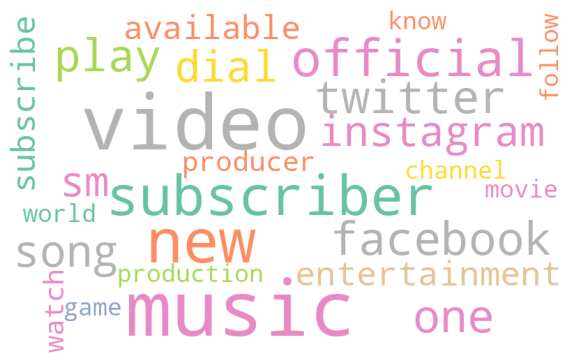

In [0]:
## ALL
#words_exp = new_df['text_lemmatized_ngram_join'].astype(str).str.strip('[] ').explode()
words_trial = new_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_final = ' '.join( [w for w in words_trial.split() if len(w)>1] )

#words_all = ' '.join([text for text in words_exp]).replace("'",'').replace('n', '').replace('u', '')
#words_all_trial = words_exp.str.cat(sep=' ')

wordcloud_ = WordCloud(width = 800, background_color = 'white', collocations = False , height = 500, random_state = 21, max_font_size = 110, max_words = 25, colormap = 'Set2').generate(words_final)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_)
plt.axis('off')
plt.show()

In [0]:
rel_all = wordcloud_.words_
rel_all

Out[139]: {'music': 1.0,
 'video': 0.9814232471465176,
 'new': 0.5810039599347775,
 'subscriber': 0.47862799906825065,
 'official': 0.40822268809690193,
 'twitter': 0.32558816678313535,
 'facebook': 0.32191940368040994,
 'one': 0.3120778010715118,
 'play': 0.30567202422548334,
 'song': 0.29786862334032144,
 'dial': 0.2919869555089681,
 'instagram': 0.27707896575821106,
 'sm': 0.2720708129513161,
 'entertainment': 0.25943396226415094,
 'available': 0.242254833449802,
 'subscribe': 0.2389937106918239,
 'producer': 0.22880270207314232,
 'watch': 0.2258327509899837,
 'production': 0.223445143256464,
 'movie': 0.2215816445376194,
 'know': 0.22064989517819705,
 'world': 0.21936873980899138,
 'channel': 0.2189610994642441,
 'game': 0.21564174237130213,
 'follow': 0.21296296296296297}

In [0]:
new_df['category_id'] = new_df['category_id'].astype(float).astype(int)

<command-1161426566899789>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df['category_id'] = new_df['category_id'].astype(float).astype(int)


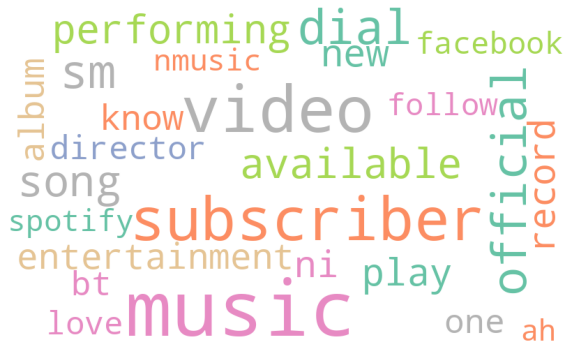

In [0]:
## Music

music_df = new_df[new_df["category_id"] == 10]

#words_exp_mu = music_df['text_lemmatized_ngram'].astype(str).str.split(',').explode().astype(str).str.strip('[] ')
#words_mu = ' '.join([text for text in words_exp_mu])

words_exp_mu = music_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_mu = ' '.join( [w for w in words_exp_mu.split() if len(w)>1] )

wordcloud_mu = WordCloud(width = 800, background_color = 'white', collocations = False, colormap = 'Set2', height = 500, random_state = 21, max_font_size = 110, max_words = 25).generate(words_mu)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_mu)
plt.axis('off')
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary = wordcloud.process_text(words_mu)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_mu.words_


#rel = wordcloud_mu.words_mu
rel_freq

Out[149]: {'music': 1.0,
 'video': 0.6789413118527042,
 'subscriber': 0.5824223245109321,
 'dial': 0.358457997698504,
 'official': 0.35579689298043726,
 'sm': 0.3353711162255466,
 'song': 0.28991657077100114,
 'available': 0.26136363636363635,
 'performing': 0.2459723820483314,
 'play': 0.21655638665132337,
 'new': 0.2162686996547756,
 'record': 0.20922036823935558,
 'ni': 0.20735040276179517,
 'entertainment': 0.20375431530494822,
 'know': 0.1965621403912543,
 'album': 0.19282220943613348,
 'one': 0.1782940161104718,
 'bt': 0.1753452243958573,
 'director': 0.16484464902186421,
 'love': 0.15700517836593786,
 'facebook': 0.14592922899884925,
 'follow': 0.1436277330264672,
 'nmusic': 0.13852128883774453,
 'spotify': 0.13593210586881474,
 'ah': 0.1281645569620253}

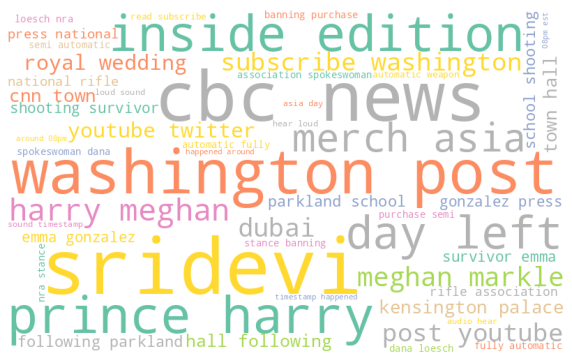

In [0]:
## News and Politics

pol_df = new_df[new_df["category_id"] == 25]
words_exp_pol = pol_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_pol = ' '.join( [w for w in words_exp_pol.split() if len(w)>1] )

wordcloud_pol = WordCloud(width = 800, background_color = 'white', collocations = 0.3, height = 500, random_state = 21, max_font_size = 110, max_words = 50, colormap = 'Set2').generate(words_pol)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_pol)
plt.axis('off')
plt.savefig("news.png", format="png")
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_pol = wordcloud.process_text(words_pol)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_pol.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_pol.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[239]: {'sridevi': 1.0,
 'cbc news': 0.8,
 'washington post': 0.6,
 'prince harry': 0.5733333333333334,
 'inside edition': 0.56,
 'day left': 0.5333333333333333,
 'merch asia': 0.5333333333333333,
 'harry meghan': 0.4666666666666667,
 'meghan markle': 0.4666666666666667,
 'dubai': 0.4533333333333333,
 'subscribe washington': 0.4533333333333333,
 'post youtube': 0.4533333333333333,
 'youtube twitter': 0.4533333333333333,
 'royal wedding': 0.44,
 'kensington palace': 0.4,
 'cnn town': 0.4,
 'town hall': 0.4,
 'hall following': 0.4,
 'following parkland': 0.4,
 'parkland school': 0.4,
 'school shooting': 0.4,
 'shooting survivor': 0.4,
 'survivor emma': 0.4,
 'emma gonzalez': 0.4,
 'gonzalez press': 0.4,
 'press national': 0.4,
 'national rifle': 0.4,
 'rifle association': 0.4,
 'association spokeswoman': 0.4,
 'spokeswoman dana': 0.4,
 'dana loesch': 0.4,
 'loesch nra': 0.4,
 'nra stance': 0.4,
 'stance banning': 0.4,
 'banning purchase': 0.4,
 'purchase semi': 0.4,
 'semi automatic':

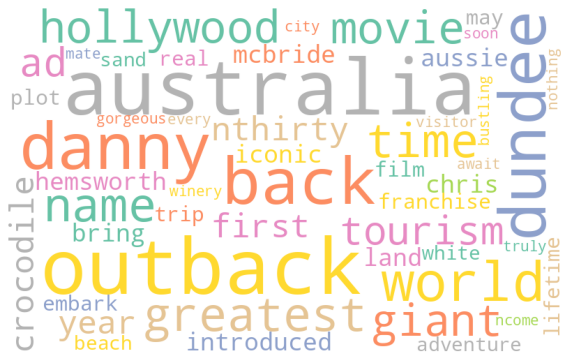

In [0]:
## Travel and Events

travel_df = new_df[new_df["category_id"] == 19]
words_exp_travel = travel_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_travel = ' '.join( [w for w in words_exp_travel.split() if len(w)>1] )

wordcloud_travel = WordCloud(width = 800, background_color = 'white', collocations = False, height = 500, random_state = 21, max_font_size = 110, max_words = 50, colormap = 'Set2').generate(words_travel)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_travel)
plt.axis('off')
plt.savefig("news.png", format="png")
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_travel = wordcloud.process_text(words_travel)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_pol.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_travel.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[166]: {'outback': 1.0,
 'australia': 1.0,
 'back': 0.6666666666666666,
 'dundee': 0.6666666666666666,
 'danny': 0.6666666666666666,
 'world': 0.4583333333333333,
 'greatest': 0.3333333333333333,
 'name': 0.3333333333333333,
 'time': 0.3333333333333333,
 'hollywood': 0.3333333333333333,
 'movie': 0.3333333333333333,
 'giant': 0.3333333333333333,
 'tourism': 0.3333333333333333,
 'ad': 0.3333333333333333,
 'nthirty': 0.3333333333333333,
 'year': 0.3333333333333333,
 'crocodile': 0.3333333333333333,
 'first': 0.3333333333333333,
 'introduced': 0.3333333333333333,
 'land': 0.3333333333333333,
 'chris': 0.3333333333333333,
 'hemsworth': 0.3333333333333333,
 'mcbride': 0.3333333333333333,
 'bring': 0.3333333333333333,
 'iconic': 0.3333333333333333,
 'aussie': 0.3333333333333333,
 'franchise': 0.3333333333333333,
 'embark': 0.3333333333333333,
 'trip': 0.3333333333333333,
 'lifetime': 0.3333333333333333,
 'film': 0.3333333333333333,
 'plot': 0.3333333333333333,
 'may': 0.3333333333333333,


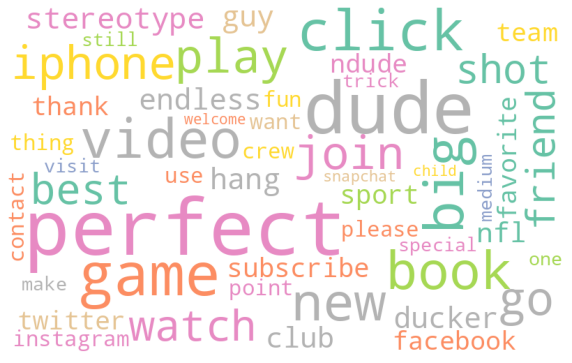

In [0]:
## sports

sports_df = new_df[new_df["category_id"] == 17]
words_exp_sports = sports_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_sports = ' '.join( [w for w in words_exp_sports.split() if len(w)>1] )

wordcloud_sports = WordCloud(width = 800, background_color = 'white', collocations = False, height = 500, random_state = 21, max_font_size = 110, max_words = 50, colormap = 'Set2').generate(words_sports)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_sports)
plt.axis('off')
plt.savefig("news.png", format="png")
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_sports = wordcloud.process_text(words_sports)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_sports.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_sports.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[167]: {'perfect': 1.0,
 'dude': 0.8700305810397554,
 'game': 0.563302752293578,
 'click': 0.5021406727828747,
 'big': 0.4804281345565749,
 'video': 0.47003058103975537,
 'new': 0.44495412844036697,
 'book': 0.44403669724770645,
 'play': 0.3562691131498471,
 'go': 0.34831804281345563,
 'iphone': 0.336085626911315,
 'join': 0.3330275229357798,
 'watch': 0.2834862385321101,
 'best': 0.27186544342507646,
 'shot': 0.24617737003058104,
 'friend': 0.23516819571865444,
 'stereotype': 0.23058103975535169,
 'endless': 0.22201834862385322,
 'ducker': 0.22201834862385322,
 'hang': 0.22201834862385322,
 'guy': 0.22201834862385322,
 'club': 0.21651376146788992,
 'nfl': 0.20397553516819572,
 'sport': 0.18287461773700306,
 'subscribe': 0.18042813455657492,
 'twitter': 0.1709480122324159,
 'thank': 0.16788990825688074,
 'facebook': 0.16666666666666666,
 'team': 0.16238532110091744,
 'ndude': 0.15902140672782875,
 'favorite': 0.1565749235474006,
 'instagram': 0.15015290519877675,
 'use': 0.150152905

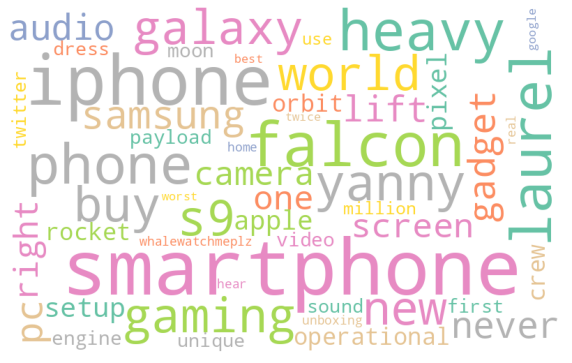

In [0]:
## Science and Tech

sci_df = new_df[new_df["category_id"] == 28]
words_exp_sci = sci_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_sci = ' '.join( [w for w in words_exp_sci.split() if len(w)>1] )

wordcloud_sci = WordCloud(width = 800, background_color = 'white', collocations = False, height = 500, random_state = 21, max_font_size = 110, max_words = 50, colormap = 'Set2').generate(words_sci)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_sci)
plt.axis('off')
plt.savefig("news.png", format="png")
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_sci = wordcloud.process_text(words_sci)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_sci.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_sci.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[168]: {'smartphone': 1.0,
 'iphone': 0.7957559681697612,
 'falcon': 0.6047745358090185,
 'heavy': 0.5039787798408488,
 'laurel': 0.4986737400530504,
 'phone': 0.48010610079575594,
 'yanny': 0.3925729442970822,
 's9': 0.37002652519893897,
 'gaming': 0.3647214854111406,
 'buy': 0.3620689655172414,
 'world': 0.35145888594164454,
 'galaxy': 0.34880636604774534,
 'new': 0.3395225464190981,
 'samsung': 0.2891246684350133,
 'gadget': 0.2625994694960212,
 'pc': 0.259946949602122,
 'never': 0.2493368700265252,
 'lift': 0.23872679045092837,
 'audio': 0.23607427055702918,
 'screen': 0.22413793103448276,
 'camera': 0.22413793103448276,
 'right': 0.22148541114058357,
 'one': 0.21883289124668434,
 'setup': 0.21220159151193635,
 'apple': 0.20291777188328913,
 'pixel': 0.20159151193633953,
 'operational': 0.20159151193633953,
 'rocket': 0.20159151193633953,
 'orbit': 0.20159151193633953,
 'crew': 0.20159151193633953,
 'payload': 0.20159151193633953,
 'engine': 0.20159151193633953,
 'moon': 0.20159

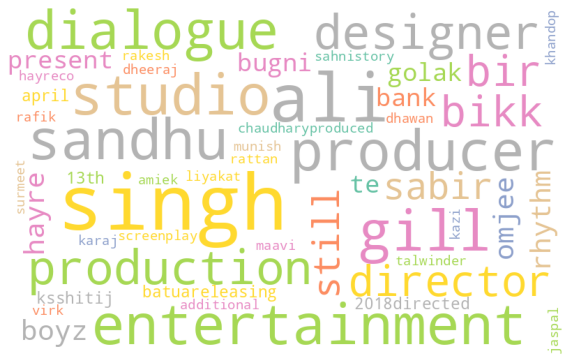

In [0]:
## Movies

movies_df = new_df[new_df["category_id"] == 30]
words_exp_movies = movies_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_movies = ' '.join( [w for w in words_exp_movies.split() if len(w)>1] )

wordcloud_movies = WordCloud(width = 800, background_color = 'white', collocations = False, height = 500, random_state = 21, max_font_size = 110, max_words = 50, colormap = 'Set2').generate(words_movies)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_movies)
plt.axis('off')
plt.savefig("news.png", format="png")
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_movies = wordcloud.process_text(words_movies)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_movies.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_movies.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[169]: {'singh': 1.0,
 'ali': 0.75,
 'entertainment': 0.5,
 'studio': 0.5,
 'gill': 0.5,
 'producer': 0.5,
 'sandhu': 0.5,
 'dialogue': 0.5,
 'production': 0.5,
 'designer': 0.5,
 'director': 0.5,
 'bir': 0.5,
 'bikk': 0.5,
 'sabir': 0.5,
 'still': 0.5,
 'rhythm': 0.25,
 'boyz': 0.25,
 'hayre': 0.25,
 'omjee': 0.25,
 'present': 0.25,
 'golak': 0.25,
 'bugni': 0.25,
 'bank': 0.25,
 'te': 0.25,
 'batuareleasing': 0.25,
 '13th': 0.25,
 'april': 0.25,
 '2018directed': 0.25,
 'ksshitij': 0.25,
 'chaudharyproduced': 0.25,
 'karaj': 0.25,
 'talwinder': 0.25,
 'hayreco': 0.25,
 'jaspal': 0.25,
 'amiek': 0.25,
 'virk': 0.25,
 'munish': 0.25,
 'sahnistory': 0.25,
 'screenplay': 0.25,
 'dheeraj': 0.25,
 'rattan': 0.25,
 'rakesh': 0.25,
 'dhawan': 0.25,
 'additional': 0.25,
 'surmeet': 0.25,
 'maavi': 0.25,
 'kazi': 0.25,
 'rafik': 0.25,
 'liyakat': 0.25,
 'khandop': 0.25}

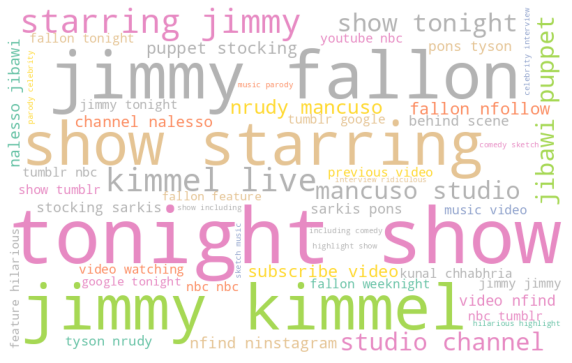

In [0]:
## Entertainment

ent_df = new_df[new_df["category_id"] == 23]

#words_exp_mu = music_df['text_lemmatized_ngram'].astype(str).str.split(',').explode().astype(str).str.strip('[] ')
#words_mu = ' '.join([text for text in words_exp_mu])

words_exp_ent = ent_df['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_ent = ' '.join( [w for w in words_exp_ent.split() if len(w)>1] )

wordcloud_ent = WordCloud(width = 800, background_color = 'white', collocations = 0.3, colormap = 'Set2', height = 500, random_state = 21, max_font_size = 110, max_words = 50).generate(words_ent)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_ent)
plt.axis('off')
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_ent = wordcloud.process_text(words_ent)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_ent.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_ent.words_

#rel = wordcloud_mu.words_mu
rel_freq

Out[256]: {'tonight show': 1.0,
 'jimmy fallon': 0.7132352941176471,
 'jimmy kimmel': 0.6338235294117647,
 'show starring': 0.5705882352941176,
 'starring jimmy': 0.5705882352941176,
 'kimmel live': 0.5176470588235295,
 'show tonight': 0.2852941176470588,
 'studio channel': 0.27058823529411763,
 'jibawi puppet': 0.27058823529411763,
 'mancuso studio': 0.27058823529411763,
 'nrudy mancuso': 0.25588235294117645,
 'puppet stocking': 0.25,
 'subscribe video': 0.2485294117647059,
 'fallon nfollow': 0.2411764705882353,
 'nfind ninstagram': 0.23823529411764705,
 'channel nalesso': 0.23823529411764705,
 'nalesso jibawi': 0.23823529411764705,
 'video nfind': 0.2161764705882353,
 'behind scene': 0.19264705882352942,
 'stocking sarkis': 0.18823529411764706,
 'sarkis pons': 0.18823529411764706,
 'pons tyson': 0.18823529411764706,
 'tyson nrudy': 0.175,
 'nbc nbc': 0.16470588235294117,
 'kunal chhabhria': 0.16176470588235295,
 'previous video': 0.16029411764705884,
 'music video': 0.151470588235294

## Visualizations - Wordcloud - filtered

In [0]:
filtered_df = df.drop_duplicates(subset=['video_id'])

In [0]:
new_df_fil = filtered_df[['video_id', 'trending_date', 'title', 'channel_title', 'category_id', 'text_lemmatized_ngram', 'text_lemmatized_ngram_join', 'tags', 'views', 'likes', 'dislikes', 'comment_count', 'length']]

new_df_fil.display()

video_id,trending_date,title,channel_title,category_id,text_lemmatized_ngram,text_lemmatized_ngram_join,tags,views,likes,dislikes,comment_count,length
0KVJcOTWZ_c,18.20.03,aha naa pellanta ugadi special event 18th march 2018 full episode etv telugu,etvteluguindia,24,"List(jabardasth, katharnak, comedy, show, popular, telugu, tv, comedy, show, rated, excellent, among, telugu, broadcast, etv, channel, telugu, state, india, show, first, telecast, etv, 7, february, 2014, featuring, popular, telugu, film, industry, actor, producer, nagendra, babu, telugu, film, actress, politician, roja, latest, update, etv, channel, subscribe, latest, episode, like, u, follow, u)",jabardasth katharnak comedy show popular telugu tv comedy show rated excellent among telugu broadcast etv channel telugu state india show first telecast etv 7 february 2014 featuring popular telugu film industry actor producer nagendra babu telugu film actress politician roja latest update etv channel subscribe latest episode like u follow u,etv shows eenadu television padutha theeyaga super2 dhee jodi jabardasth extra jabardsth etv20 etv comedy show extra jabardasth naga babu roja anchor anasuya rashmi dhanraj chandra chanti comedy short films raghava rocket raghava roller raghu venu wonders comedy skits in telugu racha ravi adhire abhi fata fut fun shaking sheshu sudigaali rocking rakesh adhire abhi kiraak rp hyper aadi raising raju venkey monkeys durga rao,5489650,44489,5598,7281,555.0
DMl1YJyqEdo,18.20.03,shada full video parmish verma desi crew latest punjabi song 2018,speed records,10,"List(watch, parmish, verma, newest, video, shada, right, exclusively, speed, record, nsinger, parmish, verma, nmusic, desi, crew, nlyrics, sarba, maan, nvideo, parmish, verma, nmix, mastered, sameer, charegaonkar, fb, gk, digital, nlabel, speed, record, nlisten, shada, exclusively, hungama, right, share, spread, love, nenjoy, stay, connected, u, subscribe, speed, record, like, u, facebook, follow, u, twitter, follow, u, instagram, follow, snapchat, nvirasat, facebook, link, tv, facebook, link, ninstagram, poon, nsnapchat)",watch parmish verma newest video shada right exclusively speed record nsinger parmish verma nmusic desi crew nlyrics sarba maan nvideo parmish verma nmix mastered sameer charegaonkar fb gk digital nlabel speed record nlisten shada exclusively hungama right share spread love nenjoy stay connected u subscribe speed record like u facebook follow u twitter follow u instagram follow snapchat nvirasat facebook link tv facebook link ninstagram poon nsnapchat,punjabi songs punjabi bhangra punjabi music punjabi bhangra music punjabi latest songs punjabi bhangra latest punjabi songs 2018 punjab speed records shada shada parmish verma permish verma shada taur naal shada taur naal shada parmish taur naal shada parmish verma parmish verma new songs parmish verma punjabi songs tour naal shada tour naal shada parmish verma shada punjabi song shadaa punjabi shada video parmish verma songs taur nal shada,8020245,277004,29998,30935,1336.0
AeJ6xTBXA7w,18.20.03,pooja sayak,rathore cassettes,10,"List(pls, subscribe, channel, watch, latest, song, bhajan, kisse, lokgeet, aalha, mor, title, song, singer, pooja, sayak, 897972819, 8193012541, akhil, raja, artist, pooja, sayak, ajju, shivani, pankaj, shilpi, lyric, raja, anadi, narender, kumar, raj, anadi, music, director, akhil, ajay, sonotek, onwer, hansraj, railhan, office, number, 011, 23268079, music, label, copyright, rathore, cassette, mail, u, sonotekaudio, gmailcom, ncontact, company, person, leela, krishan, railhan, 91, 9212183337, ncontact, company, person, ankit, vij, 91, 9899429419, nenjoy, stay, connected, u, cassette, nfollow, g, rathore, cassette)",pls subscribe channel watch latest song bhajan kisse lokgeet aalha mor title song singer pooja sayak 897972819 8193012541 akhil raja artist pooja sayak ajju shivani pankaj shilpi lyric raja anadi narender kumar raj anadi music director akhil ajay sonotek onwer hansraj railhan offic

In [0]:
new_df_fil.shape

Out[202]: (1660, 13)

In [0]:
save_df_fil = new_df_fil[['video_id', 'trending_date', 'title', 'channel_title', 'category_id', 'text_lemmatized_ngram_join', 'tags', 'views', 'likes', 'dislikes', 'comment_count', 'length']]

In [0]:
abc=spark.createDataFrame(save_df_fil)   # coverting pandas df to spark df
abc.write.format("com.databricks.spark.csv").option("header","true").save("dbfs:/FileStore/shared_uploads/serenaparve@gwu.edu/final_df/save_df_fil_final.csv")   #storing file

In [0]:
final_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/serenaparve@gwu.edu/final_df/save_df_fil.csv") # reading file

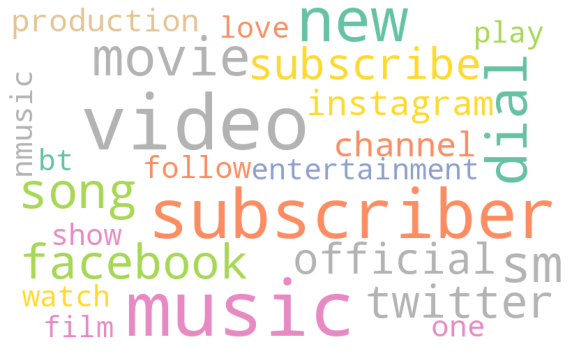

In [0]:
## ALL
#words_exp = new_df['text_lemmatized_ngram_join'].astype(str).str.strip('[] ').explode()
words_trial_fil = new_df_fil['text_lemmatized_ngram_join'].str.cat(sep=' ')
words_final_fil = ' '.join( [w for w in words_trial_fil.split() if len(w)>1] )

wordcloud_fil = WordCloud(width = 800, background_color = 'white', collocations = False , height = 500, random_state = 21, max_font_size = 110, max_words = 25, colormap = 'Set2').generate(words_final_fil)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_fil)
plt.axis('off')
plt.show()

In [0]:
# create a dictionary of word frequencies
text_dictionary_fil = wordcloud.process_text(words_final_fil)

# sort the dictionary
word_freq={k: v for k, v in sorted(text_dictionary_fil.items(),reverse=True, key=lambda item: item[1])}

#use words_ to print relative word frequencies
rel_freq=wordcloud_fil.words_


#rel = wordcloud_mu.words_mu
rel_freq

Out[204]: {'music': 1.0,
 'video': 0.9747587230883444,
 'subscriber': 0.7787676317743133,
 'new': 0.6169265033407573,
 'dial': 0.504083147735709,
 'movie': 0.44766146993318484,
 'sm': 0.437268002969562,
 'song': 0.38530066815144765,
 'facebook': 0.3548626577579807,
 'twitter': 0.32516703786191536,
 'subscribe': 0.3244246473645137,
 'official': 0.31328878990348924,
 'instagram': 0.2746844840386043,
 'channel': 0.26874536005939126,
 'production': 0.26874536005939126,
 'follow': 0.24944320712694878,
 'nmusic': 0.2479584261321455,
 'one': 0.2479584261321455,
 'entertainment': 0.23162583518930957,
 'film': 0.23088344469190794,
 'play': 0.22642910170749814,
 'show': 0.22197475872308833,
 'love': 0.22048997772828507,
 'bt': 0.21752041573867856,
 'watch': 0.214550853749072}